In [1]:
from copy import deepcopy

import numpy as np
import pandas as pd
from scipy.cluster import hierarchy as sch

from matplotlib import pyplot as plt

import scanpy as sc
import squidpy as sq

%matplotlib inline

c:\Users\wjd4002\AppData\Local\Programs\Python\Python312\Lib\site-packages\anndata\utils.py:429: FutureWarning: Importing read_text from `anndata` is deprecated. Import anndata.io.read_text instead.
  warnings.warn(msg, FutureWarning)


In [2]:
### Vizgen (MERFISH) Mouse Liver Data and create an AnnData Object
adata = sq.read.vizgen(path="Liver1Slice1", counts_file="D:/MERFISH/Replicate2/cell_by_gene_S2R2.csv", meta_file="D:/MERFISH/Replicate2/cell_metadata_S2R2.csv")
adata

AnnData object with n_obs × n_vars = 84172 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [3]:
### Data Pre-processing
adata.var_names_make_unique()
adata.var["mt"] = adata.var_names.str.startswith("mt-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], percent_top=(50, 100, 200, 300), inplace=True)
adata

AnnData object with n_obs × n_vars = 84172 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_300_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [4]:
# Filter cells with low expression and genes that are expressed in too few cells
sc.pp.filter_cells(adata, min_counts=50)
sc.pp.filter_genes(adata, min_cells=10)
adata

AnnData object with n_obs × n_vars = 84168 × 483
    obs: 'fov', 'volume', 'min_x', 'max_x', 'min_y', 'max_y', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_300_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_counts'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells'
    uns: 'spatial'
    obsm: 'blank_genes', 'spatial'

In [5]:
### Scanpy workflow
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.scale(adata, max_value=10)
sc.tl.pca(adata, svd_solver="arpack")
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=20)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=1.5)

C:\Users\wjd4002\AppData\Local\Temp\ipykernel_10168\1425356144.py:8: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=1.5)


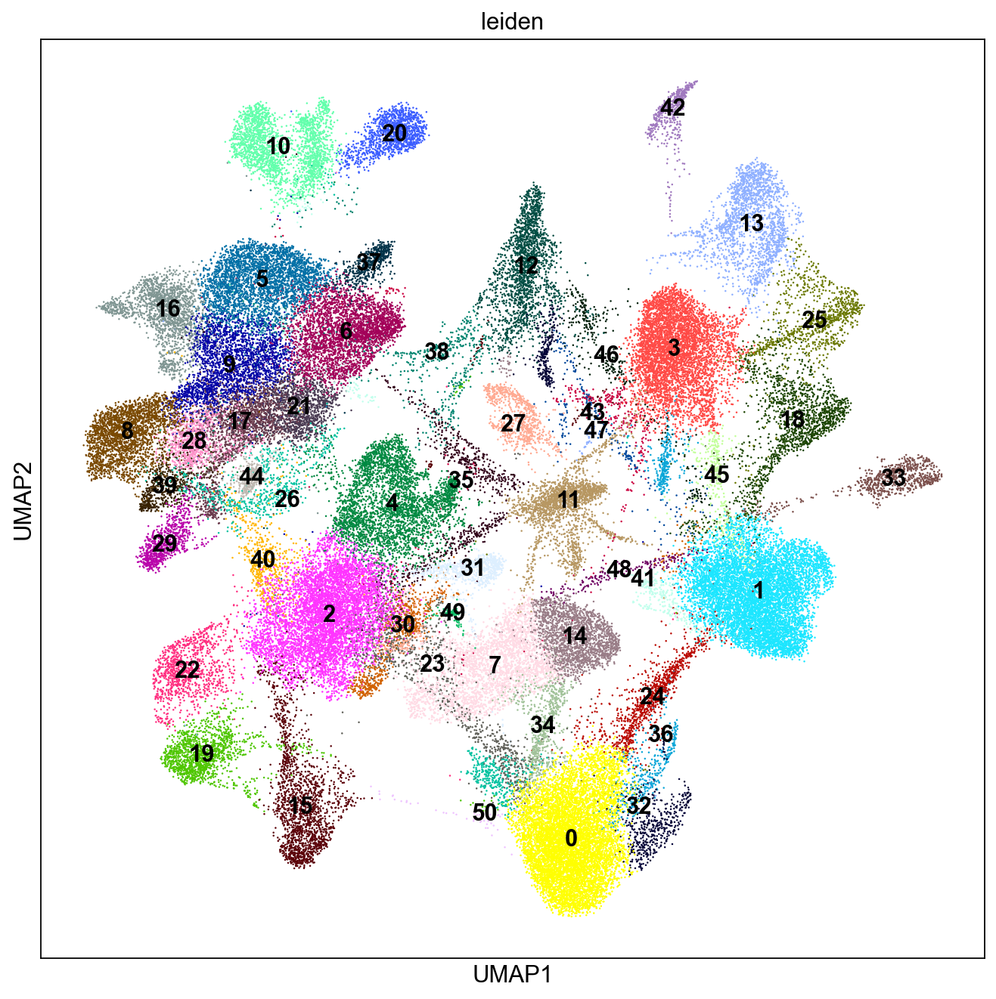

In [6]:
# visualize the distributions of the Leiden clusters in the UMAP plot
sc.set_figure_params(figsize=(10, 10))
sc.pl.umap(adata, color=["leiden"], legend_loc='on data', size=5)

c:\Users\wjd4002\AppData\Local\Programs\Python\Python312\Lib\site-packages\squidpy\pl\_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


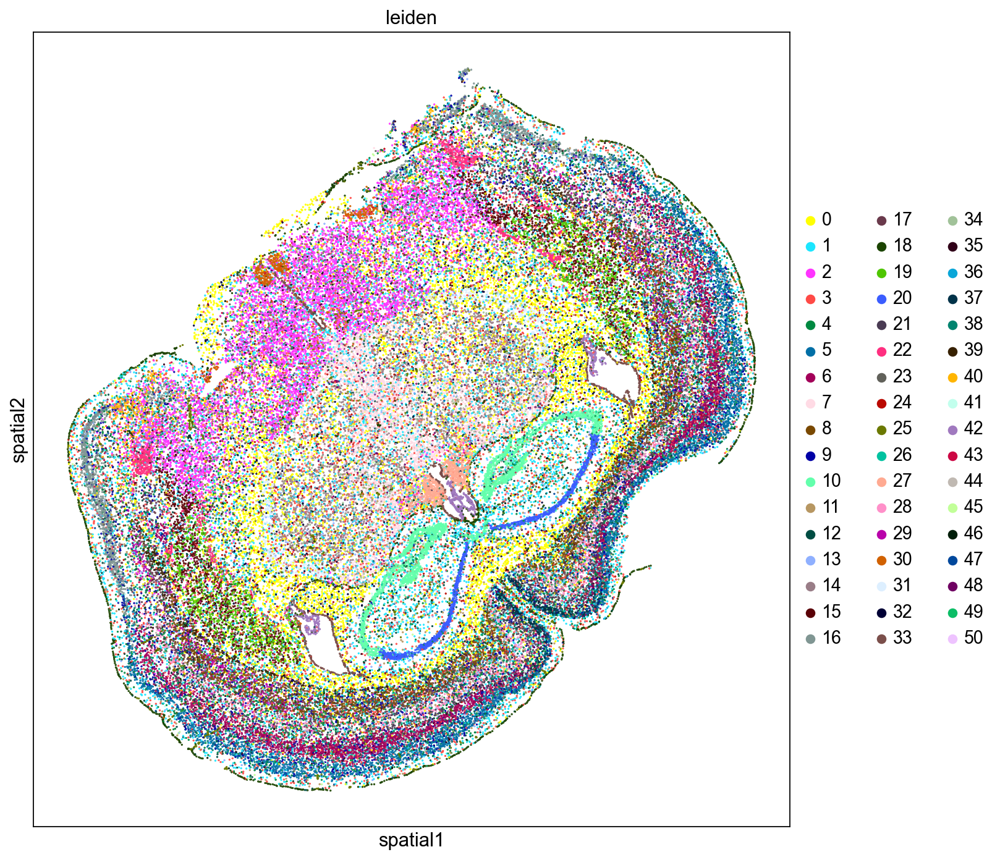

In [7]:
# visualize the spatial locations of cells in the mouse liver colored by Leiden cluster
sq.pl.spatial_scatter(adata, shape=None, color="leiden", size=0.5, library_id="spatial", figsize=(10, 10))

In [11]:
print(adata.var_names[:20])


Index(['Oxgr1', 'Htr1a', 'Htr1b', 'Htr1d', 'Htr1f', 'Htr2a', 'Htr2b', 'Htr2c',
       'Htr4', 'Htr5a', 'Htr5b', 'Htr6', 'Htr7', 'Adora1', 'Adora2a',
       'Adora2b', 'Adora3', 'Adgra1', 'Adgra2', 'Adgra3'],
      dtype='object')


In [14]:
genes_of_interest = ["Pcalm", "Bin1", "Apoe", "Gfap", "Mbp"]
found_genes = [gene for gene in genes_of_interest if gene in adata.var_names]
print("Genes encontrados:", found_genes)


Genes encontrados: ['Gfap']


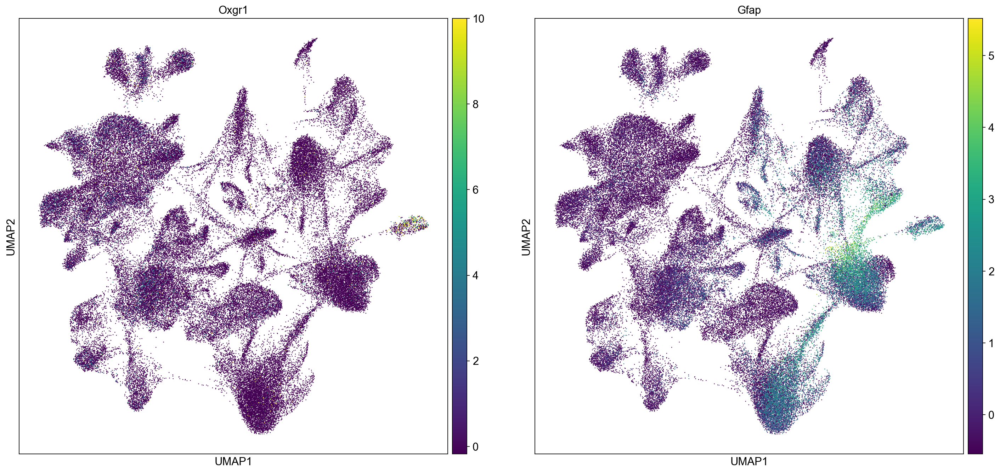

In [15]:
sc.pl.umap(adata, color=["Oxgr1", "Gfap"], legend_loc='on data', size=5) 

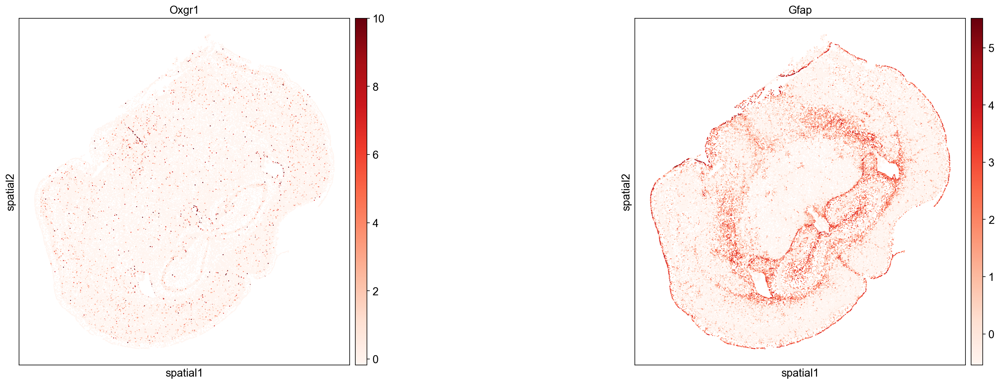

In [16]:
# Hepatocyte on spatial coordinates
sq.pl.spatial_scatter(adata, color=["Oxgr1", "Gfap"], size=15, cmap="Reds", img=False, figsize=(12, 8))

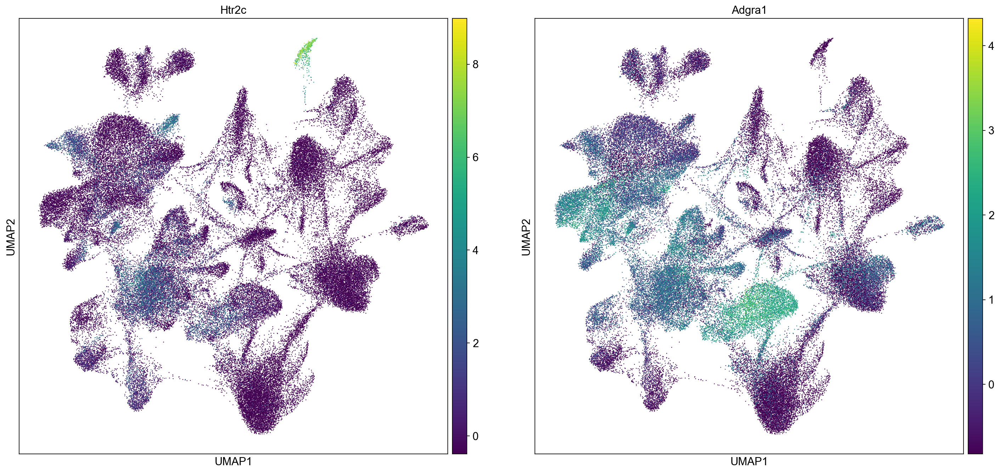

In [ ]:
sc.pl.umap(adata, color=["Htr2c", "Adgra1"], legend_loc='on data', size=5) # Other cells

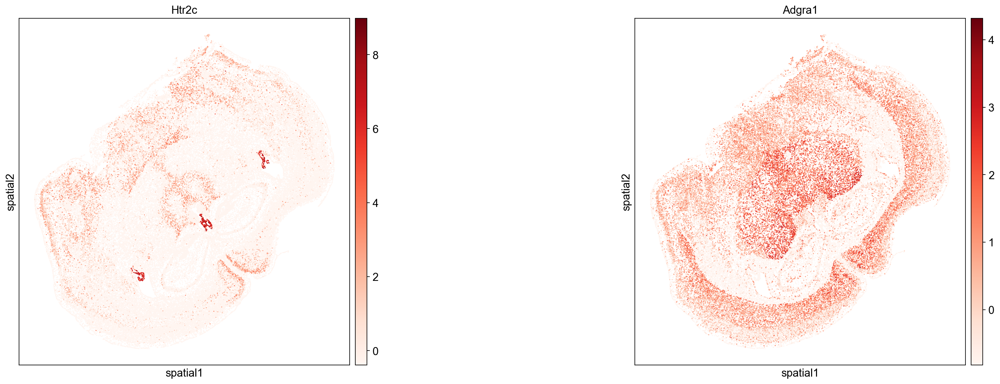

In [24]:
# Hepatocyte on spatial coordinates
sq.pl.spatial_scatter(adata, color=["Htr2c", "Adgra1"], size=15, cmap="Reds", img=False, figsize=(12, 8))

In [25]:
### Neighborhood Enrichment test: This test determines if cells belonging to two different clusters are close to each other more often than expected on tissue
# calculate a connectivity graph, cells (nodes) and cell-cell interactions (edges) 
sq.gr.spatial_neighbors(adata, coord_type="generic", spatial_key="spatial") 
sq.gr.nhood_enrichment(adata, cluster_key="leiden")

  0%|          | 0/1000 [00:00<?, ?/s]

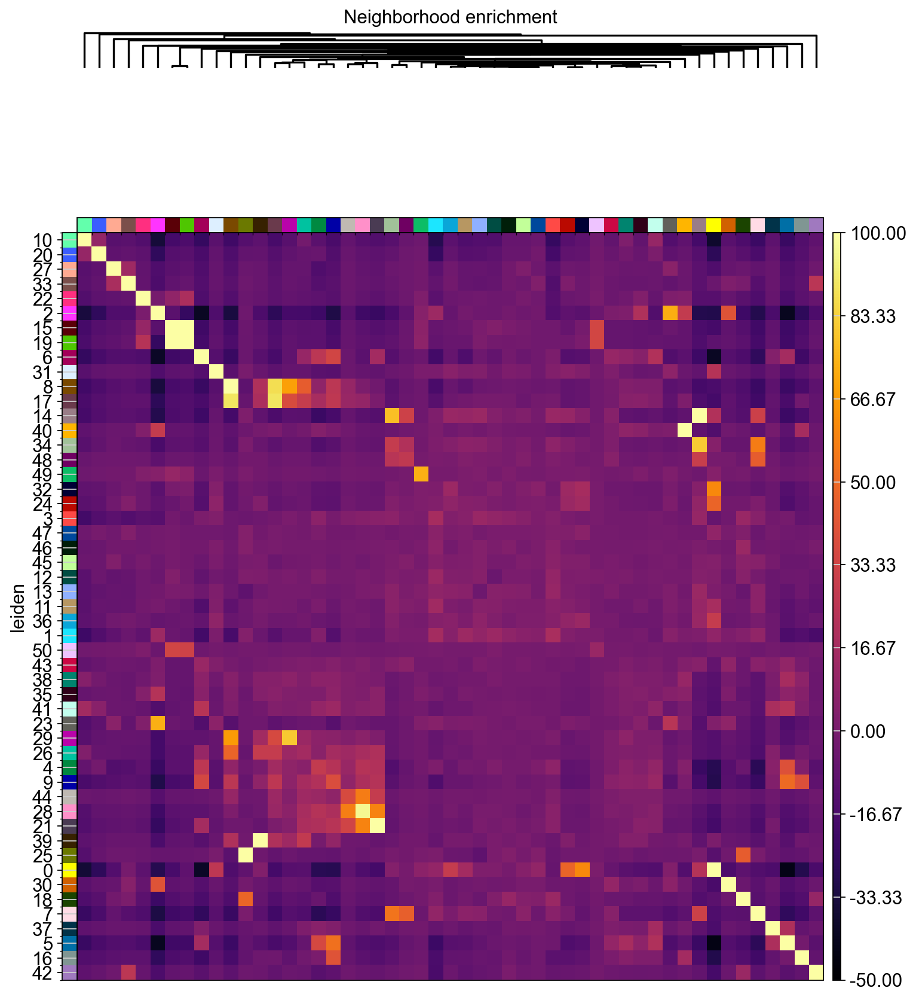

In [26]:
## hierarchically clustered heatmap shows clusters of enriched neighborhoods in the liver tissue
sq.pl.nhood_enrichment(adata, cluster_key="leiden", method="average", cmap="inferno", vmin=-50, vmax=100, figsize=(10, 10)) 

In [27]:
Neighborhood_clusters=['14', '19', '20']
bdata=adata[adata.obs.leiden.isin(Neighborhood_clusters )]

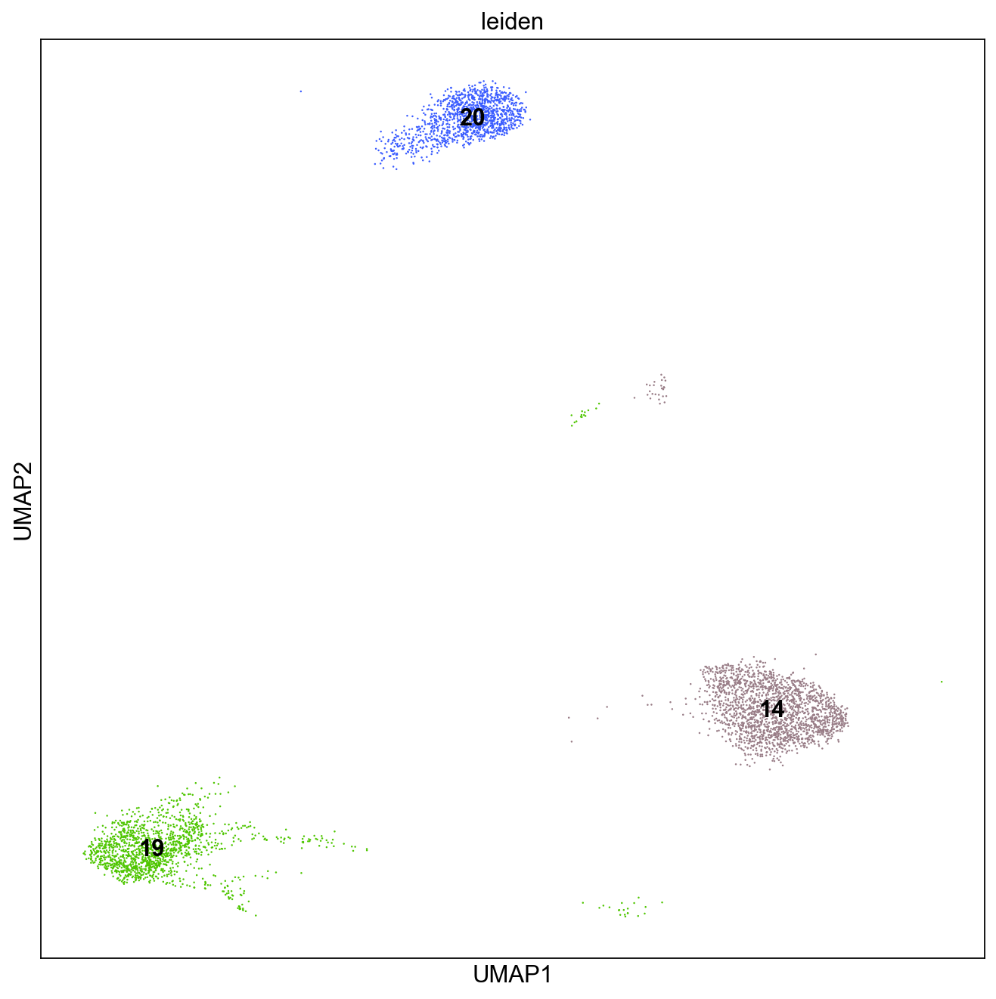

In [28]:
sc.pl.umap(bdata, color=["leiden"], legend_loc='on data', size=5)

c:\Users\wjd4002\AppData\Local\Programs\Python\Python312\Lib\site-packages\squidpy\pl\_color_utils.py:28: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  target.uns[color_key] = source.uns[color_key]
c:\Users\wjd4002\AppData\Local\Programs\Python\Python312\Lib\site-packages\squidpy\pl\_spatial_utils.py:976: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


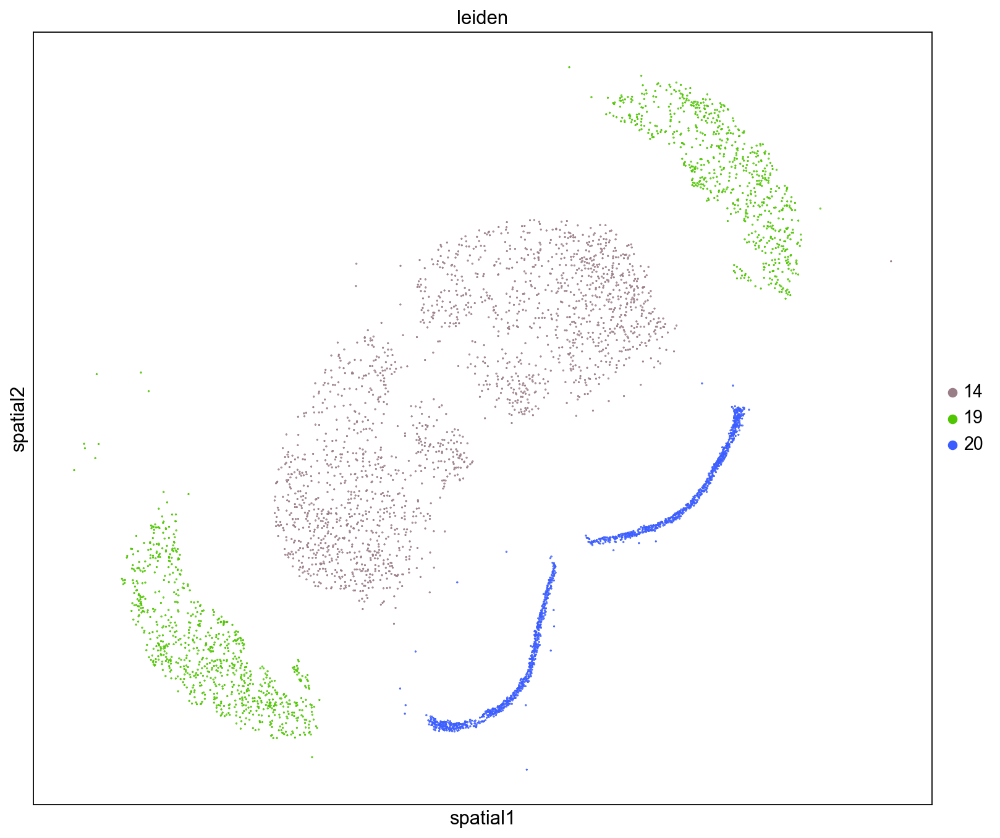

In [29]:
sq.pl.spatial_scatter(bdata, shape=None, color="leiden", size=0.5, library_id="spatial", figsize=(10, 10))

In [30]:
### Autocorrelation: Moran’s I Score: investigate the spatial distributions of genes expressed in the tissue
sq.gr.spatial_autocorr(adata, mode="moran")
num_view = 12
top_autocorr = (adata.uns["moranI"]["I"].sort_values(ascending=False).head(num_view).index.tolist())
bot_autocorr = (adata.uns["moranI"]["I"].sort_values(ascending=True).head(num_view).index.tolist())

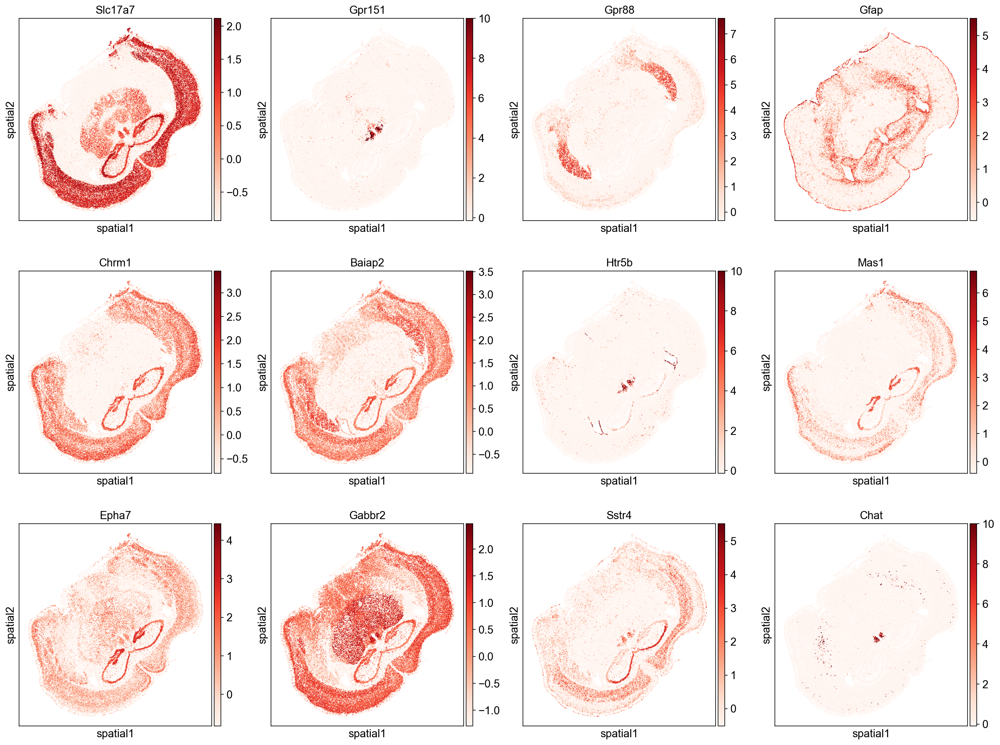

In [31]:
# Genes with high spatial autocorrelation
sq.pl.spatial_scatter(adata, color=top_autocorr, size=20, cmap="Reds", img=False, figsize=(5, 5))